# 🐶🐕 End-to-End Multiclass Dog Breed Classification

This notebook builds a multiclass image classifier using Tensorflow and Tensorflow Hub.

## 1. Problem
Identifying the breed of the dog by the given image.

## 2. Data
Provided with a training set and a test set of images of dogs. Each image has a filename that is its unique id. The dataset comprises 120 breeds of dogs. The list of breeds is as follows:
* affenpinscher
* afghan_hound
* african_hunting_dog
* airedale
* american_staffordshire_terrier
* appenzeller
* australian_terrier
* basenji
* basset
* beagle
* bedlington_terrier
* bernese_mountain_dog
* black-and-tan_coonhound
* blenheim_spaniel
* bloodhound
* bluetick
* border_collie
* border_terrier
* borzoi
* boston_bull
* bouvier_des_flandres
* boxer
* brabancon_griffon
* briard
* brittany_spaniel
* bull_mastiff
* cairn
* cardigan
* chesapeake_bay_retriever
* chihuahua
* chow
* clumber
* cocker_spaniel
* collie
* curly-coated_retriever
* dandie_dinmont
* dhole
* dingo
* doberman
* english_foxhound
* english_setter
* english_springer
* entlebucher
* eskimo_dog
* flat-coated_retriever
* french_bulldog
* german_shepherd
* german_short-haired_pointer
* giant_schnauzer
* golden_retriever
* gordon_setter
* great_dane
* great_pyrenees
* greater_swiss_mountain_dog
* groenendael
* ibizan_hound
* irish_setter
* irish_terrier
* irish_water_spaniel
* irish_wolfhound
* italian_greyhound
* japanese_spaniel
* keeshond
* kelpie
* kerry_blue_terrier
* komondor
* kuvasz
* labrador_retriever
* lakeland_terrier
* leonberg
* lhasa
* malamute
* malinois
* maltese_dog
* mexican_hairless
* miniature_pinscher
* miniature_poodle
* miniature_schnauzer
* newfoundland
* norfolk_terrier
* norwegian_elkhound
* norwich_terrier
* old_english_sheepdog
* otterhound
* papillon
* pekinese
* pembroke
* pomeranian
* pug
* redbone
* rhodesian_ridgeback
* rottweiler
* saint_bernard
* saluki
* samoyed
* schipperke
* scotch_terrier
* scottish_deerhound
* sealyham_terrier
* shetland_sheepdog
* shih-tzu
* siberian_husky
* silky_terrier
* soft-coated_wheaten_terrier
* staffordshire_bullterrier
* standard_poodle
* standard_schnauzer
* sussex_spaniel
* tibetan_mastiff
* tibetan_terrier
* toy_poodle
* toy_terrier
* vizsla
* walker_hound
* weimaraner
* welsh_springer_spaniel
* west_highland_white_terrier
* whippet
* wire-haired_fox_terrier
* yorkshire_terrier

The link to datasets: https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation
The evaluation is a file with prediction probability for each dog breed of each test image.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* Dealing with images (unstructured data) so, We are using DL/TL.
* 120 breeds of dogs (120 different classes)
* 10000+ images in trainig sets (They have laebls.)
* 10000+ images in test sets (They don't have labels.)

# 🔗🔗Getting our Workspace ready

In [ ]:
# Import Tensorlfow & Tensorflow Hub in Google Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version: ", tf.__version__)
print("TF_Hub Version: ", hub.__version__)

#Check for GPU Availability
print("GPU","Available (Yess!!)" if tf.config.list_physical_devices("GPU") else "Note Available :(")

TF Version:  2.11.0
TF_Hub Version:  0.12.0
GPU Available (Yess!!)


# Importing the data & changing it into Tensors 
> ## With all ML Models, our data must be in numeric form
> ## Let's start by fetching our data & checking out the labels.


In [ ]:
#Checkout the labels of the data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/1_Deep_Learning/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


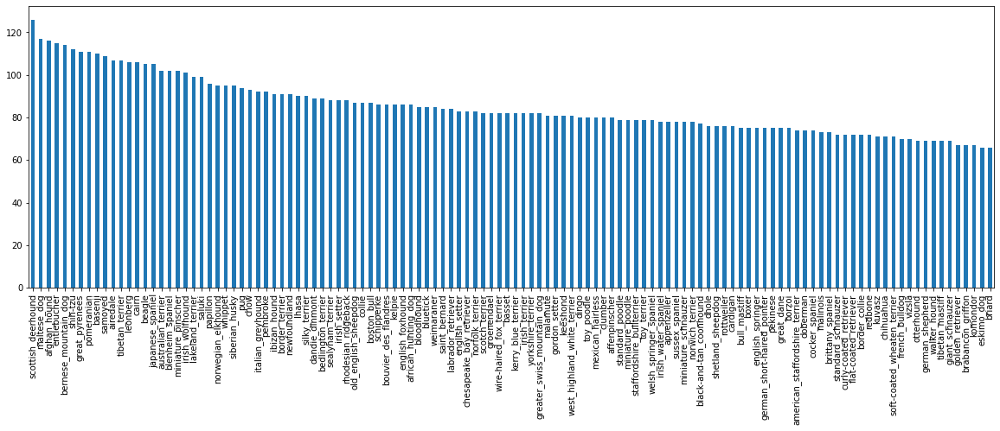

In [ ]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,6));

In [ ]:
labels_csv.breed.value_counts().median()

82.0

In [ ]:
!pip install IPython

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 66.7 MB/s eta 0:00:00


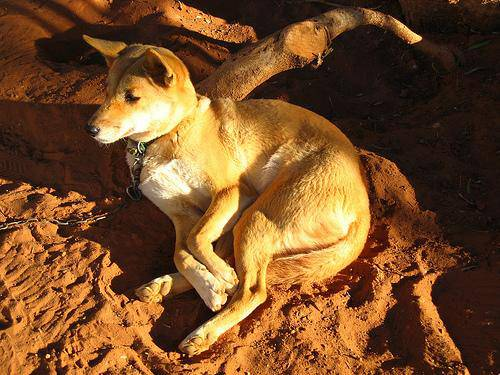

In [ ]:
#Viewing the images in Google Collab
from IPython.display import Image
img = Image("drive/MyDrive/1_Deep_Learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")
img

# Getting images & their labels
## Let's get all of our image's file  pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
filenames = ["drive/MyDrive/1_Deep_Learning/train/" + fname1 + ".jpg" for fname1 in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/1_Deep_Learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/1_Deep_Learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/1_Deep_Learning/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/1_Deep_Learning/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/1_Deep_Learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/1_Deep_Learning/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/1_Deep_Learning/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/1_Deep_Learning/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/1_Deep_Learning/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/1_Deep_Learning/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check wheather number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/1_Deep_Learning/train/")) == len(filenames):
  print("Filenames matches actual amount of files..")
else:
  print("Filenames do not matches actual amount of files, check the target directory")

Filenames matches actual amount of files..


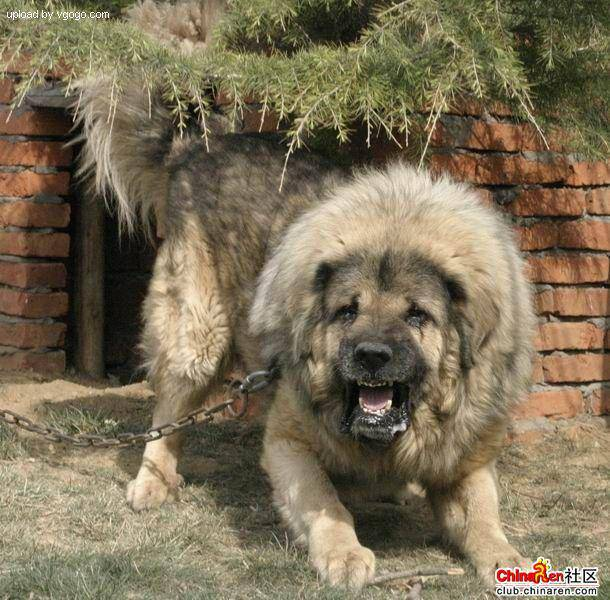

In [ ]:
# One More Check
Image(filenames[9000])

In [ ]:
labels_csv.breed[9000]

'tibetan_mastiff'

# We've got our training image filepaths in a alist, now preparing our labels.

In [ ]:
import numpy as np
labels = labels_csv.breed
labels = np.array(labels)
labels[:20]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound', 'shetland_sheepdog', 'walker_hound',
       'maltese_dog', 'bluetick', 'norfolk_terrier',
       'african_hunting_dog', 'wire-haired_fox_terrier', 'redbone',
       'lakeland_terrier', 'boxer'], dtype=object)

In [ ]:
# Checking if the no. of labels matches the no. of filenames
if len(labels) == len(filenames):
  print("No. of Labels matches no.of filenames! Proceed!!!!")
else:
  print("STOP!!!! No. of Labels doesn't match with no. of filenames")

No. of Labels matches no.of filenames! Proceed!!!!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
 # Turning and checking single label into an array of booleans
 print(labels[0])
 labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turning and checking every label into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Example: Turning Boolean Array into integers
print(labels[0]) #Original Labels
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a "1" where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[99])
print(boolean_labels[99].astype(int))

boxer
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own Validation set
> Since, there was no validation set on kaggle.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

# Start to experiment with ~ 1000 images/data initially & will increase as needed

In [ ]:
# Set number of imaegs to use for experimentation
NUM_IMAEGS = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split the data into train & Validation
from sklearn.model_selection import train_test_split

#Split into trainig & Vlidation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAEGS],
                                                  y[:NUM_IMAEGS],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's peek at the training data
X_train[:2], y_train[:2]

(['drive/MyDrive/1_Deep_Learning/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/1_Deep_Learning/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, 

# Preprocessing Images (Turning images into Tensors)
# Creating functions to turn images into tensors
1. take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` into Tensors
4. Normalize our `image` (Converting color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

First, Checking what an image looks like.

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# Turning Image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
# Defining image size
IMG_SIZE = 224

#Creating function to preprocess images
def process_images(image_path):
  #Read image file
  image = tf.io.read_file(image_path)

  #Turn jpg image to numerical Tensors with 3 colors channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the color channels values from 0-255 to 0-1 (Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resizing the image to (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

# Turning data into batches
### Why turn our data into batches?
> ✅ Because, Processing all data in one go might not fit into memory. So, that's why we do about 32 (Batch Size) images at a time.

> ✅ In order to use Tensorflow effectively, we need our data in the form of Tensor Tuple which looks like this:
`(image, label)`

In [ ]:
#Creating a function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_images(image_path)
  return image, label

In [ ]:
(process_images(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

# We have turned our data into Tuples of Tensors in the form `(image, label)`
> Now let's nake a functon to turn all of our data (X & y) into batches of size 32.

In [ ]:
#Definig Batch Size (32)
BATCH_SIZE = 32
 #Creating function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates a batch of data out of image(X) and label (y) pairs
  Shuffles the data if it's trainig data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  #If data is a test dataset, we probably don't have labesl
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_images).batch(BATCH_SIZE)
    return data_batch

  #If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating Validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y))) # filepaths & labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn files & labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    #Creating (image, label) tuples (also turn image paths into preprocessed image)
    data = data.map(get_image_label)

    # Turning training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Creating trainig and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating Validation data batches...


In [ ]:
#Checking the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches but hard to understand. So visualizing it now.

In [ ]:
import matplotlib.pyplot as plt
#Create a function for viewing images in a data batches
def show_25_images(images, labels):
  #Setting up the figure
  plt.figure(figsize=(15,10))
  #Loop through 25 images
  for i in range(25):
    #creating a subplots (5 rows 5 columns)
    ax = plt.subplot(5, 5, i+1)
    #Display Images
    plt.imshow(images[i])
    #Adding image labels as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turning gridlines off
    plt.axis("off")

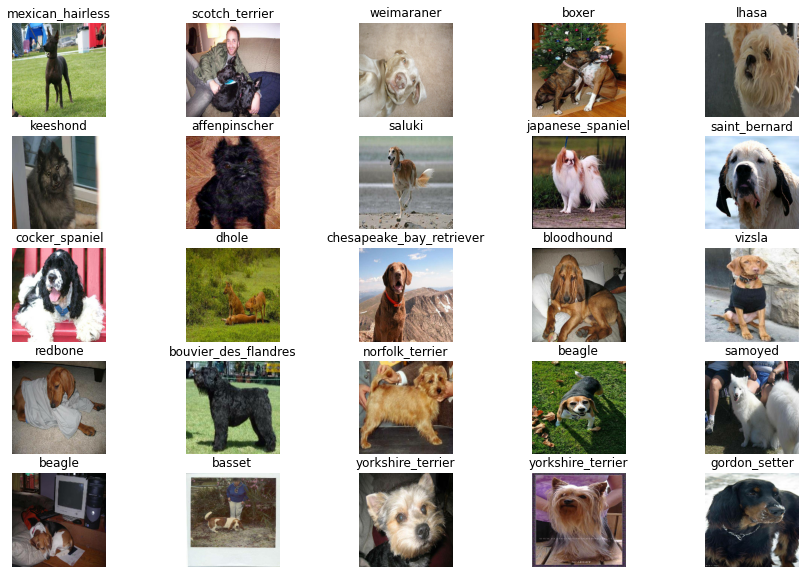

In [ ]:
#Now visualizing teh data in tarining batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

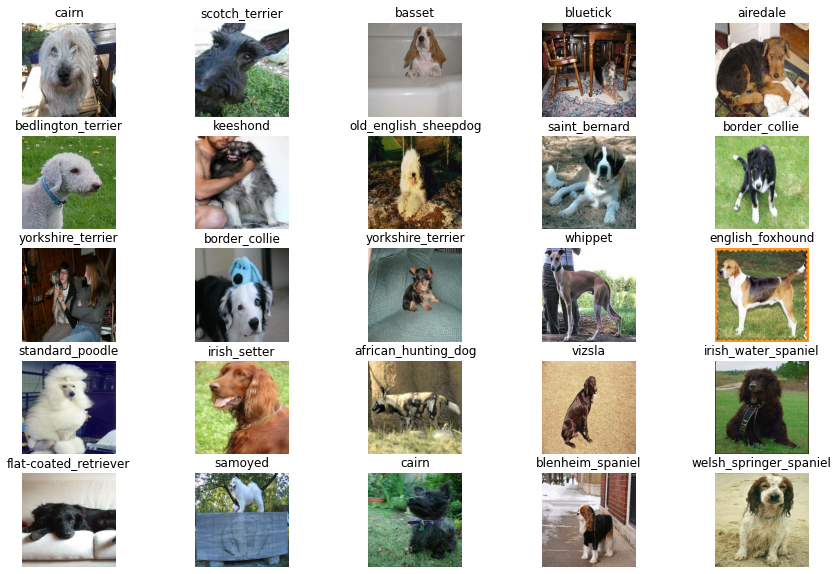

In [ ]:
# Now let's visualize the data in a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Building a model

#### We will use transfer learning here (Tensorflow Hub)
* The inputs shape (our images shapes, in the form of tensors) to our model
* The outputs shape (image label, in the form of Tensors) of our mdoel
* The URLs if the model we want to use from TF Hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setting input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channesls

# Setting output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setting model url from Tensorflow Hub
MODEL_URL =  "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

# Putting inputs, outputs and model together in DL model
### Let's create a function wich:
* Takes input shapes, output shapes and teh mdoel we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compile sthe model (says how it should be evaluated & improved).
* Build sthe model(tells the model the inputs shape it'll be getting).
* Returns the model.

In [ ]:
#Creating the function
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  #Setting up the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # layer2 (Output layer)
  ])

  #Compiling the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Building the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating callbacks
### We'll create 2 callbacks for:
* One for TensorBoard which tracks our model progress
* Another for early stopping if the model stops improving (Prevents Overfitting)

# TensorBoard Callback
### To setup tensorBoard callback we need to do 3 things:
* Load Tensorboard notebok extension
* Create a Tensorboard callbck which is able to save logs to a directory and pass it to our model's `fit()` function.
* Visualize our models training logs with the %tensorboard magic function (will do this after model training)

In [ ]:
# Loading Tesnsorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Creating a function to build a tensorboard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/1_Deep_Learning/logs",
                        # Making it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

In [ ]:
# Early Stopping Callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Trainig a model (on subset of data)

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}

In [ ]:
# Ckecking to make sure taht we are still runinng on GPU
print("GPU","Available (Yess!!!)" if tf.config.list_physical_devices("GPU") else "Not Available :(")

GPU Available (Yess!!!)


# Creating a function which trains a model
* Creating a model using `create_model()`
* Setup a TensorBoard callback using create_tensorboard_callback()
* call the fit() function on our model passng it to the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Building a function to train & return a trained model
def train_model():
  #Create a model
  model = create_model() 

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback( )

  #Fit the model to the data passing it to the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  #Return the model
  return model

In [ ]:
#Fitting the modle to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 190s 7s/step - loss: 4.6090 - accuracy: 0.1013 - val_loss: 3.3415 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 4s 148ms/step - loss: 1.6476 - accuracy: 0.6975 - val_loss: 2.1005 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 121ms/step - loss: 0.5554 - accuracy: 0.9375 - val_loss: 1.6590 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 4s 156ms/step - loss: 0.2559 - accuracy: 0.9850 - val_loss: 1.4575 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 140ms/step - loss: 0.1474 - accuracy: 0.9950 - val_loss: 1.3880 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 3s 121ms/step - loss: 0.1016 - accuracy: 0.9987 - val_loss: 1.3421 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

## Checking the TensorBoard Logs

### The tensorboard magic function `(%tensorboard)` will access the logs directory we created earlier & visualize its content.

In [ ]:
%tensorboard --logdir drive/MyDrive/1_Deep_Learning/logs

<IPython.core.display.Javascript object>

# Making & Evaluating Prediction using a trained model

In [ ]:
# Making prediction on validation data
prediction = model.predict(val_data, verbose=1)
prediction

7/7 [==============================] - 3s 86ms/step


array([[6.8272033e-04, 1.2321549e-04, 2.3084835e-03, ..., 3.3602092e-04,
        3.1214167e-05, 2.6268526e-03],
       [2.8030478e-04, 4.8198344e-04, 1.0248538e-02, ..., 2.6127114e-05,
        7.8179338e-04, 4.9337844e-04],
       [1.3659555e-05, 8.8364424e-05, 9.0247304e-06, ..., 2.3558812e-04,
        5.5105003e-05, 6.5133040e-04],
       ...,
       [7.5347816e-06, 8.2306578e-06, 6.4698397e-05, ..., 8.4308936e-05,
        2.3089121e-04, 1.7681494e-04],
       [3.1386372e-03, 1.0426565e-03, 4.7062256e-04, ..., 2.2312281e-04,
        9.6579890e-05, 2.0340141e-02],
       [1.5991558e-04, 2.1079597e-05, 6.0180784e-04, ..., 1.8313885e-02,
        7.7982363e-04, 3.6800178e-04]], dtype=float32)

In [ ]:
prediction.shape

(200, 120)

In [ ]:
np.sum(prediction[0])

0.99999994

In [ ]:
#First Prediction
index=42
print(prediction[index])
print(f"Max Value (Probability of prediction): {np.max(prediction[index])}")
print(f"Sum: {np.sum(prediction[index])}")
print(f"Max index: {np.argmax(prediction[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(prediction[index])]}")


[3.35390614e-05 1.81591058e-05 3.50033588e-05 2.16034969e-05
 1.69485353e-03 2.25938747e-05 2.73669750e-04 5.32414997e-04
 8.27625208e-03 1.21235605e-02 6.52846120e-06 3.84971054e-06
 8.11026766e-05 5.19695133e-03 4.78914677e-04 9.44364117e-04
 2.46605359e-05 5.89979114e-04 2.15316220e-04 1.17420126e-03
 3.90518253e-05 1.00515201e-03 9.00020859e-06 4.30755608e-05
 7.08886655e-03 6.59063953e-05 1.10211777e-05 1.09578810e-04
 7.67417441e-05 3.65273008e-05 3.98461743e-05 1.37636496e-04
 1.23525722e-04 7.33001434e-05 6.08076625e-05 3.00865067e-05
 3.06626862e-05 1.94669352e-04 2.40895635e-04 4.34233785e-01
 1.81171315e-04 8.03045896e-06 8.37822724e-03 3.70043358e-06
 3.48787842e-04 1.32066089e-05 1.37844167e-04 1.33780006e-03
 2.76506416e-05 4.40087839e-04 2.91794131e-04 6.43410094e-05
 2.95251433e-04 2.60312227e-03 2.16584940e-05 2.60958477e-04
 1.96414156e-04 1.01101155e-04 6.48102141e-05 6.12517215e-06
 4.20861070e-05 7.01404759e-04 2.16830886e-05 4.27807208e-05
 3.81833306e-05 1.482366

In [ ]:
unique_breeds[113]

'walker_hound'

In [ ]:
# Turn Prediction Probabilities into their respective label
def get_pred_label (prediction_probabilities):
  """
  Turns an array of prediction probabilitis into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Getting a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(prediction[81])
pred_label

'dingo'

Since our validation dataset is still in Batch dataset, we'll have to unbatchify it to make presiction on the validation images & then compare those prediction to th evalidation labels (truth labels).

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create afunction to unbatch a batched data
def unbatchify (data):
  """
  Takes a batched datasets of (image, label) Tensors abd returns separate arrays of images 7 labels.
  """
  images = []
  labels= []

  #Looping through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

#Unbatchify the validation data
val_image, val_labels = unbatchify(val_data)
val_image[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

# Now we have :
* Prediction labels
* Validation Labels
* Validation Images

Let's make some functions to make these all more visual.

* We'll crete a function that takes an array of prediction    probabilities, an array of truth labels and an arary of images & integers
* Convert the predicted probabilities to a predicted labels.
* Plot the predicted label, its predicted probability, the truth label & the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot images * remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Changing the color of the title depending if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Changing the plot title to be predicted, probability of prediction and truth label
  plt.title("Predicted Label is:{} with the accuracy of {:.2f}%.\n And the actaul breed is {}.".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),color=color)

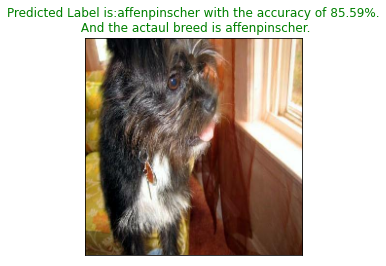

In [ ]:
plot_pred(prediction_probabilities=prediction,
          labels=val_labels,
          images=val_image,
          n=55)

## The model is predicting it's top prediction in the above section. Now let's create a function to plot the top 10 predictions of our model.
The function will:
* Take an input of prediction probability array, ground truth array & an integer.
* Find the predicted label using `get_pred_label()`
* Fin dthe Top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction Labels

* Plot th etop 10 predictions probabilities valueas & labels coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth labels for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] #[::-1] is reversing the order (i.e in Descending form)
  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #Find top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setting uo the plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  #Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

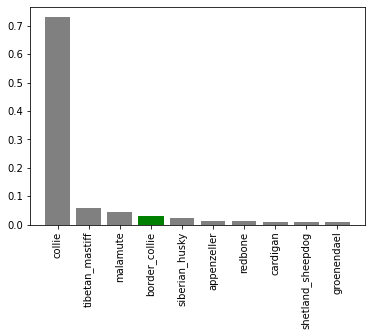

In [ ]:
plot_pred_conf(prediction_probabilities=prediction,
               labels=val_labels,
               n=9)

We have some function sto help us visualize and evaluate the model, let's check out few prediction & different values

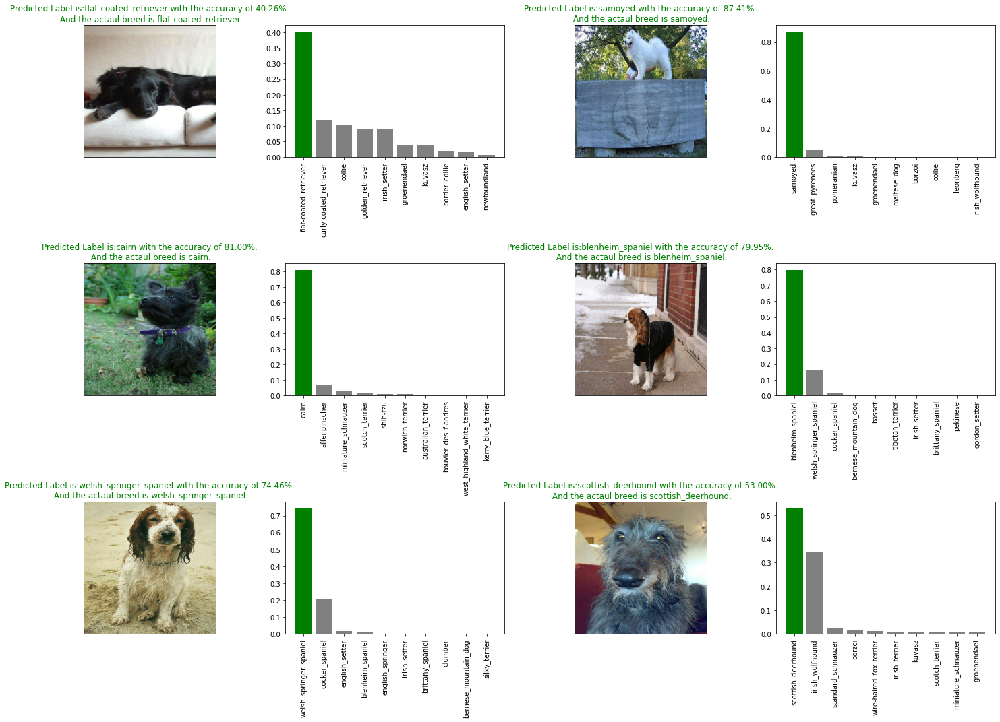

In [ ]:
#Predicting with different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels=val_labels,
            images=val_image,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=prediction,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1)
plt.show()

# Saving and Loading the model

In [ ]:
#Creating a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in model directory and appends a suffix (string)
  """
  #Creating a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/1_Deep_Learning/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #Extension of model (Save Format)
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Creating a function to load a model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading a model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer":hub.KerasLayer})
  return model

## Checking if the above 2 functions work or not

In [ ]:
#Saving model
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/1_Deep_Learning/models/20230225-13421677332561-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/1_Deep_Learning/models/20230225-13421677332561-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#Loading the model
loaded_model = load_model('drive/MyDrive/1_Deep_Learning/models/20230225-13421677332561-1000-images-mobilenetv2-Adam.h5')

Loading a model from: drive/MyDrive/1_Deep_Learning/models/20230225-13421677332561-1000-images-mobilenetv2-Adam.h5


In [ ]:
#Evaluating a pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 90ms/step - loss: 1.2174 - accuracy: 0.6850


[1.2173515558242798, 0.6850000023841858]

In [ ]:
#Evaluating theloaded model
loaded_model.evaluate(val_data)

7/7 [==============================] - 1s 92ms/step - loss: 1.2174 - accuracy: 0.6850


[1.2173515558242798, 0.6850000023841858]

# Training model in full dataset 🐶🐶

In [ ]:
(len(X), len(y)),(len(X_train), len(y_train))

((10222, 10222), (800, 800))

In [ ]:
#Creating data batch with full datasets
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Creai=ting am odel for full datsets
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
#Creating fulldata callbacks
full_model_tensorboard = create_tensorboard_callback()
#No Validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
#Fitting the model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 105ms/step - loss: 1.3375 - accuracy: 0.6671
Epoch 2/100
320/320 [==============================] - 33s 102ms/step - loss: 0.3956 - accuracy: 0.8841
Epoch 3/100
320/320 [==============================] - 33s 104ms/step - loss: 0.2380 - accuracy: 0.9347
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1581 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1066 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 45s 142ms/step - loss: 0.0771 - accuracy: 0.9861
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0598 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0471 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0371 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 33s 103m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/1_Deep_Learning/models/20230225-14281677335330-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/1_Deep_Learning/models/20230225-14281677335330-full-image-set-mobilenetv2-Adam.h5'

# Making prediction on the full image dataset
Since the model has been trained on the images in the for mof Tensor batches, to make predictions on the etst datasets we need to change it into the same format.

#To maek prediction on test data:
* Get the images filename
* Convert the filenames into test data batches using `create_data_batches()` & setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the `predict()` method called on th model.

In [ ]:
#Load test_image_files
test_path  = "drive/MyDrive/1_Deep_Learning/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/1_Deep_Learning/test/e89317cab9060dcaa19f1b669d363223.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e83f4c0ff6dec86d89d0f8b70ecd3cea.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e807c4b5025b0aa4dcbd5df2765aa8e4.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e8319b1410a984291d71a3e60c84d86c.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e850770a6575a34b1c7ad4b401692553.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e7afb35b8252782013a6700e28e327fa.jpg',
 'drive/MyDrive/1_Deep_Learning/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg']

In [ ]:
#Create test data batches
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make a prediction on test data batch using loaded full_model
test_prediction = full_model.predict(test_data,
                                    verbose=1)

324/324 [==============================] - 3398s 10s/step


In [ ]:
#Save prediction (Numpy array ) to csv file to access it later
np.savetxt("drive/MyDrive/1_Deep_Learning/preds_array.csv", test_prediction, delimiter=",")

In [ ]:
#Loadin prediction
test_prediction = np.loadtxt("drive/MyDrive/1_Deep_Learning/preds_array.csv", delimiter=",")
test_prediction[0]

array([2.59232306e-11, 1.01306146e-08, 8.73641381e-10, 8.69170478e-08,
       2.29216610e-07, 4.47562039e-01, 2.08152295e-09, 8.96275676e-09,
       2.40976057e-08, 1.07717821e-10, 1.81812947e-08, 3.31863484e-05,
       6.50849552e-06, 4.32070379e-08, 4.42458372e-08, 1.51611266e-06,
       6.67387283e-08, 2.95553750e-08, 1.41500156e-09, 4.55310271e-07,
       2.28795982e-09, 3.77767240e-09, 4.67393191e-09, 5.14383602e-09,
       1.37647447e-07, 5.70216550e-08, 4.02018765e-11, 8.91332718e-07,
       1.80382685e-07, 1.25241550e-08, 1.01334372e-08, 8.10709295e-08,
       3.08026626e-09, 4.72041357e-08, 1.82733206e-08, 3.13002541e-10,
       5.02705930e-08, 3.59639323e-08, 1.94527104e-07, 7.82410847e-09,
       4.63718708e-09, 4.77833151e-09, 6.08448638e-03, 1.04809587e-05,
       8.27693967e-08, 1.61965677e-10, 1.13755458e-08, 1.13582109e-10,
       2.73084311e-06, 4.12060984e-07, 5.07773564e-07, 1.50649339e-06,
       1.40624252e-07, 5.46156764e-01, 1.61805513e-09, 2.13329319e-08,
      

# Preparing test datasets prediction for Kaggle.
## To get the data in presentable format for Kaggle we'll:
* Create a pandas DataFrame with an ID column as well as column for each dog.
* Add data to the ID column by extracting the test image ID's from their flepaths
* Add data (prediction probabilities) to each of the dog breed column
* Export the DataFrame as csv to submit it to kaggle   

In [ ]:
#Creating a pandas DF with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
#Appending test iamges ID to preds_df
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.id = test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e89317cab9060dcaa19f1b669d363223,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e83f4c0ff6dec86d89d0f8b70ecd3cea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7e9624f2a2e61ab187358f5968bfde8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e806fbb5ca4dd3a094f7819bd810cc65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e807c4b5025b0aa4dcbd5df2765aa8e4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0745215532a68e30976e45ea0389ea61,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,06eb6e8527837abe14e0c05b310a5de9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07a61998ec9044e9c977274476e07681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,07b9276c1a3b39979d0f75027fb10dc6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_prediction
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e89317cab9060dcaa19f1b669d363223,2.592323e-11,1.013061e-08,8.736414e-10,8.691705e-08,2.292166e-07,4.475620e-01,2.081523e-09,8.962757e-09,2.409761e-08,...,3.834945e-09,1.697647e-11,8.063301e-09,1.034103e-04,7.062603e-09,1.866051e-08,4.018467e-09,3.596957e-07,2.015918e-10,1.586188e-11
1,e83f4c0ff6dec86d89d0f8b70ecd3cea,1.364197e-11,2.811645e-10,5.968860e-11,2.718405e-08,3.503123e-06,4.270998e-06,3.795790e-07,4.538232e-06,2.290953e-11,...,1.146797e-09,1.094412e-08,4.253998e-10,8.002170e-09,7.307833e-11,5.072569e-06,1.954823e-10,2.381676e-07,2.003374e-07,3.490834e-08
2,e7e9624f2a2e61ab187358f5968bfde8,1.566772e-08,5.144499e-10,1.551945e-09,2.986734e-11,6.513240e-09,1.768886e-08,1.349847e-11,4.189860e-09,2.599341e-09,...,4.938887e-09,3.874891e-09,2.185991e-08,1.864950e-09,1.665212e-10,1.475686e-07,5.864883e-09,1.320950e-09,5.251362e-10,1.739734e-09
3,e806fbb5ca4dd3a094f7819bd810cc65,3.665579e-07,7.880568e-10,2.372870e-09,9.362206e-05,2.230585e-09,5.968954e-10,1.417671e-05,3.110121e-09,7.031413e-11,...,5.828644e-08,7.413993e-09,1.396297e-08,4.164344e-08,8.173791e-11,4.329391e-08,1.117877e-07,3.394477e-09,9.859167e-01,2.626697e-06
4,e807c4b5025b0aa4dcbd5df2765aa8e4,2.071545e-11,1.704829e-11,6.633076e-12,6.587491e-14,5.519614e-10,4.814710e-09,1.264836e-13,3.203282e-10,3.954582e-10,...,1.281493e-12,1.233557e-12,7.620621e-14,4.081476e-10,2.880814e-12,6.705274e-07,6.810011e-12,7.075668e-10,8.450702e-10,2.387388e-14


In [ ]:
#Exporting the Submission csv
preds_df.to_csv("drive/MyDrive/1_Deep_Learning/Full_Model_Prediction_Submission.csv", index=False)

# Making prediction on custom images
## To make predictions on custom images we'll:
* Get the filepaths of our images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set th `test_data` parametrs to `True`.
* Pass the custom image data batch to our model's `predict()` method
* Convert the prediction output probabilities to prediction labels.
* Compare th epredicted labels to the custom images.


In [ ]:
# Get custom image filepaths
custom_paths = "drive/MyDrive/1_Deep_Learning/my-dog-photos/"
custom_image_filenames = [custom_paths + fname for fname in os.listdir(custom_paths)]
custom_image_filenames

['drive/MyDrive/1_Deep_Learning/my-dog-photos/image_2.jpg',
 'drive/MyDrive/1_Deep_Learning/my-dog-photos/image_3.jpg',
 'drive/MyDrive/1_Deep_Learning/my-dog-photos/image_1.jpg']

In [ ]:
#Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_filenames, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make prediction on custom data
custom_preds = full_model.predict(custom_data)
custom_preds[0]

1/1 [==============================] - 0s 54ms/step


array([2.7250451e-09, 7.0983402e-10, 1.0277879e-08, 4.5019075e-07,
       2.8055601e-08, 1.3253356e-07, 9.0175503e-09, 7.0408041e-10,
       1.6390730e-09, 3.1721001e-09, 1.8927102e-07, 2.3188622e-07,
       1.6210043e-06, 7.8017292e-06, 1.6491889e-06, 1.7276750e-07,
       2.6497775e-05, 2.6055501e-08, 1.2602965e-07, 2.2039066e-09,
       2.5425432e-08, 1.0606359e-08, 5.2999316e-09, 1.8239439e-06,
       7.3629588e-01, 5.0095146e-06, 1.8275140e-09, 4.1920467e-09,
       1.7188878e-01, 2.4930616e-08, 4.9758535e-07, 2.4325991e-06,
       5.9844005e-08, 1.7398867e-06, 6.5635831e-08, 2.1773484e-10,
       2.5062971e-06, 1.4690393e-06, 1.6337233e-07, 2.5838774e-05,
       3.3456117e-06, 3.1845883e-07, 5.2330106e-06, 3.0786333e-07,
       4.5259658e-02, 3.0110330e-09, 1.1202169e-07, 3.6956269e-08,
       1.4478486e-09, 3.4311559e-02, 4.6414634e-06, 2.5792818e-10,
       2.3451584e-07, 8.0409787e-05, 6.6989010e-08, 1.6286272e-09,
       5.8904534e-06, 7.4724085e-08, 1.5935582e-08, 9.6329805e

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['brittany_spaniel', 'golden_retriever', 'labrador_retriever']

In [ ]:
#Get custom images (our unbatchify( function won't work as there aren't labels..may fix later))
custom_images = []
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

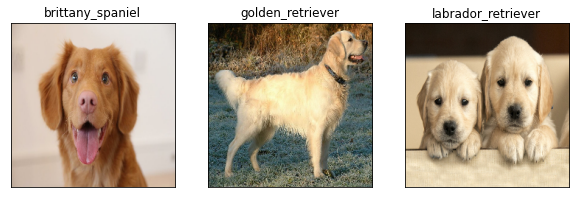

In [ ]:
# check custom image prediction
plt.figure(figsize=(10, 9))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)